Processing file: 095522039.m4a


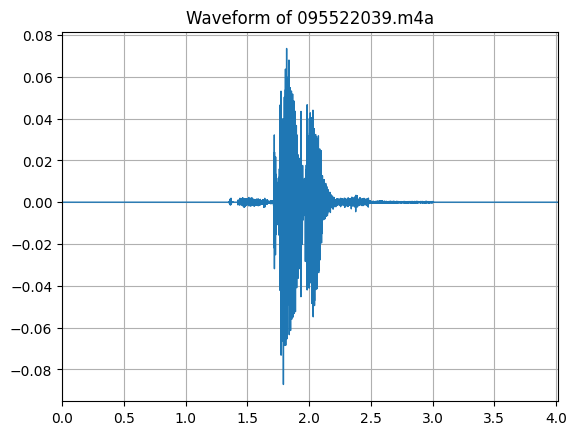

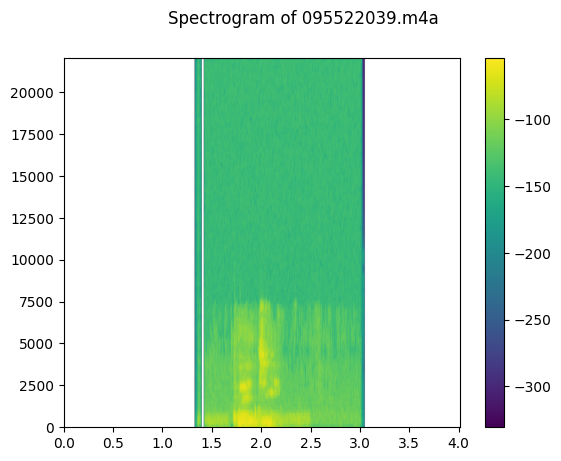

Processing file: 095522041.m4a


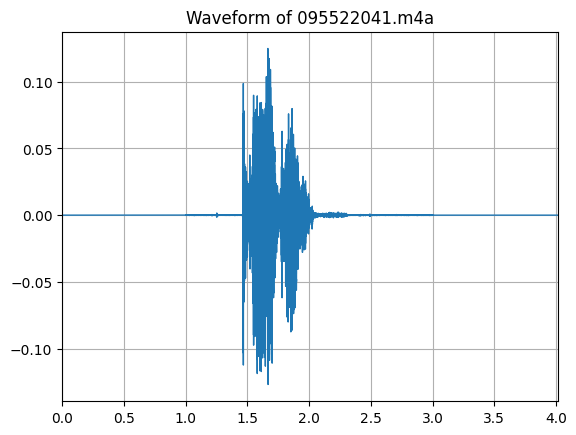

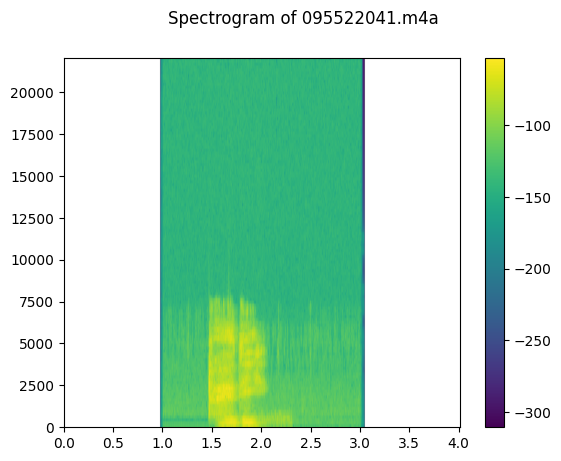

Processing file: 095522042.m4a


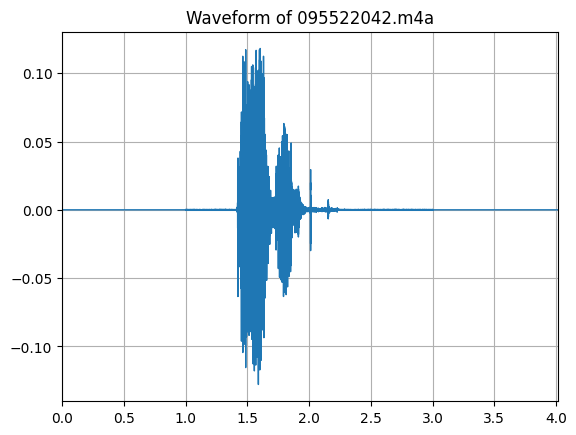

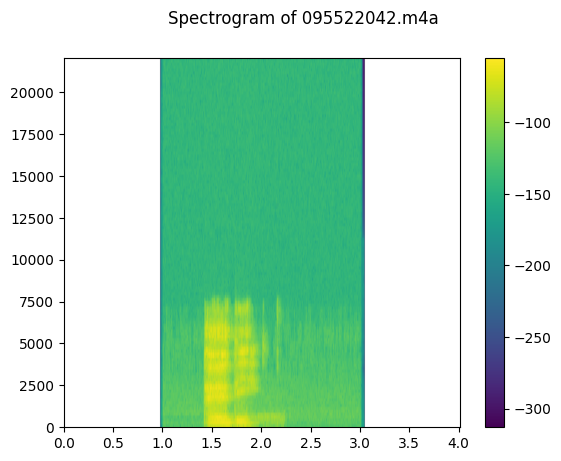

Processing file: 095522040.m4a


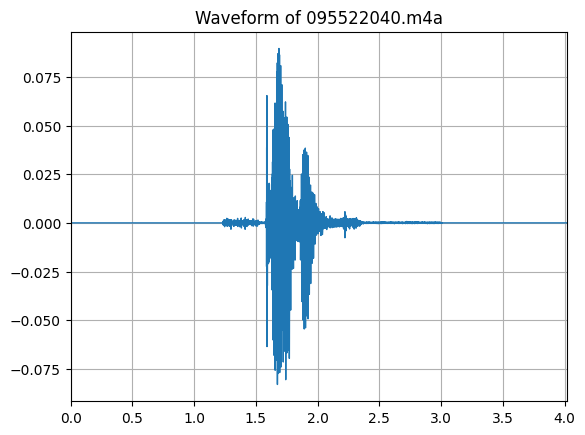

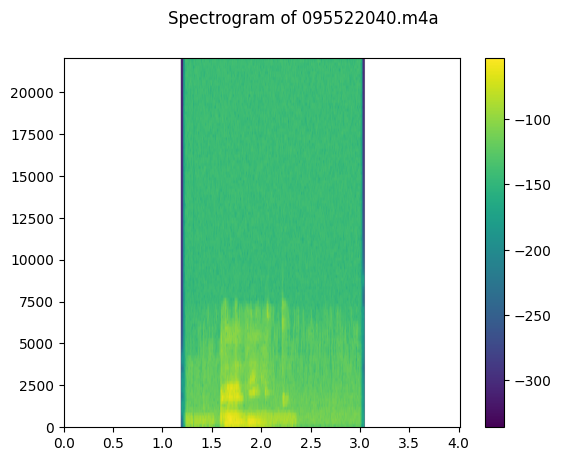

In [64]:
import os
import torchaudio
from IPython.display import Audio
import matplotlib.pyplot as plt
import torch

# Function to plot spectrogram
def plot_specgram(waveform, sample_rate, title="Spectrogram", xlim=None):
    figure, axis = plt.subplots(1, 1)
    _, _, _, cax = axis.specgram(waveform[0].numpy(), Fs=sample_rate)
    figure.suptitle(title)
    plt.colorbar(cax)
    if xlim:
        axis.set_xlim(xlim)
    plt.show()

# Function to plot waveform
def plot_waveform(waveform, sr, title="Waveform", ax=None, xlim=None):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sr

    if ax is None:
        _, ax = plt.subplots(num_channels, 1)
    ax.plot(time_axis, waveform[0], linewidth=1)
    ax.grid(True)
    if xlim:
        ax.set_xlim(xlim)
    else:
        ax.set_xlim([0, time_axis[-1]])
    ax.set_title(title)
    plt.show()


# Get the list of audio file names from the content directory
audio_files = [f for f in os.listdir('/content') if f.endswith(('.wav', '.mp3', '.m4a'))]

# Process each audio file
for file_name in audio_files:
    print(f"Processing file: {file_name}")
    try:
        # Load the audio file
        waveform, sample_rate = torchaudio.load(os.path.join('/content', file_name))

        # Define x-axis limits (example: full range)
        x_limits = [0, waveform.shape[-1] / sample_rate] # Adjust these values as needed for specific ranges

        # Plot the waveform
        plot_waveform(waveform, sample_rate, title=f"Waveform of {file_name}", xlim=x_limits)

        # Plot the spectrogram
        plot_specgram(waveform, sample_rate, title=f"Spectrogram of {file_name}", xlim=x_limits)

        # Optional: Display audio player
        display(Audio(waveform.numpy()[0], rate=sample_rate))

    except Exception as e:
        print(f"Error processing {file_name}: {e}")

In [65]:
import torch
import torchaudio
import torchaudio.functional as F
import torchaudio.transforms as T

print(torch.__version__)
print(torchaudio.__version__)

2.8.0+cu126
2.8.0+cu126


In [66]:
!pip install resampy

In [67]:
import math
import timeit

import librosa
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import pandas as pd
import resampy
from IPython.display import Audio

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

DEFAULT_OFFSET = 201


def _get_log_freq(sample_rate, max_sweep_rate, offset):
    """Get freqs evenly spaced out in log-scale, between [0, max_sweep_rate // 2]

    offset is used to avoid negative infinity `log(offset + x)`.

    """
    start, stop = math.log(offset), math.log(offset + max_sweep_rate // 2)
    return torch.exp(torch.linspace(start, stop, sample_rate, dtype=torch.double)) - offset


def _get_inverse_log_freq(freq, sample_rate, offset):
    """Find the time where the given frequency is given by _get_log_freq"""
    half = sample_rate // 2
    return sample_rate * (math.log(1 + freq / offset) / math.log(1 + half / offset))


def _get_freq_ticks(sample_rate, offset, f_max):
    # Given the original sample rate used for generating the sweep,
    # find the x-axis value where the log-scale major frequency values fall in
    times, freq = [], []
    for exp in range(2, 5):
        for v in range(1, 10):
            f = v * 10**exp
            if f < sample_rate // 2:
                t = _get_inverse_log_freq(f, sample_rate, offset) / sample_rate
                times.append(t)
                freq.append(f)
    t_max = _get_inverse_log_freq(f_max, sample_rate, offset) / sample_rate
    times.append(t_max)
    freq.append(f_max)
    return times, freq


def get_sine_sweep(sample_rate, offset=DEFAULT_OFFSET):
    max_sweep_rate = sample_rate
    freq = _get_log_freq(sample_rate, max_sweep_rate, offset)
    delta = 2 * math.pi * freq / sample_rate
    cummulative = torch.cumsum(delta, dim=0)
    signal = torch.sin(cummulative).unsqueeze(dim=0)
    return signal


def plot_sweep(
    waveform,
    sample_rate,
    title,
    max_sweep_rate=48000,
    offset=DEFAULT_OFFSET,
):
    x_ticks = [100, 500, 1000, 5000, 10000, 20000, max_sweep_rate // 2]
    y_ticks = [1000, 5000, 10000, 20000, sample_rate // 2]

    time, freq = _get_freq_ticks(max_sweep_rate, offset, sample_rate // 2)
    freq_x = [f if f in x_ticks and f <= max_sweep_rate // 2 else None for f in freq]
    freq_y = [f for f in freq if f in y_ticks and 1000 <= f <= sample_rate // 2]

    figure, axis = plt.subplots(1, 1)
    _, _, _, cax = axis.specgram(waveform[0].numpy(), Fs=sample_rate)
    plt.xticks(time, freq_x)
    plt.yticks(freq_y, freq_y)
    axis.set_xlabel("Original Signal Frequency (Hz, log scale)")
    axis.set_ylabel("Waveform Frequency (Hz)")
    axis.xaxis.grid(True, alpha=0.67)
    axis.yaxis.grid(True, alpha=0.67)
    figure.suptitle(f"{title} (sample rate: {sample_rate} Hz)")
    plt.colorbar(cax)

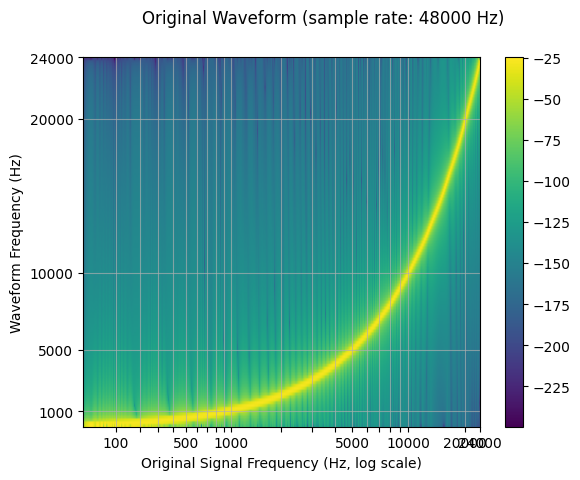

In [68]:
sample_rate = 48000
waveform = get_sine_sweep(sample_rate)

plot_sweep(waveform, sample_rate, title="Original Waveform")
Audio(waveform.numpy()[0], rate=sample_rate)

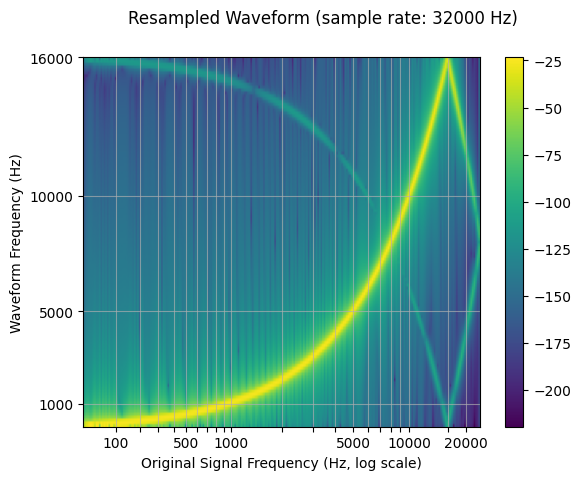

In [69]:
resample_rate = 32000
resampler = T.Resample(sample_rate, resample_rate, dtype=waveform.dtype)
resampled_waveform = resampler(waveform)

plot_sweep(resampled_waveform, resample_rate, title="Resampled Waveform")
Audio(resampled_waveform.numpy()[0], rate=resample_rate)

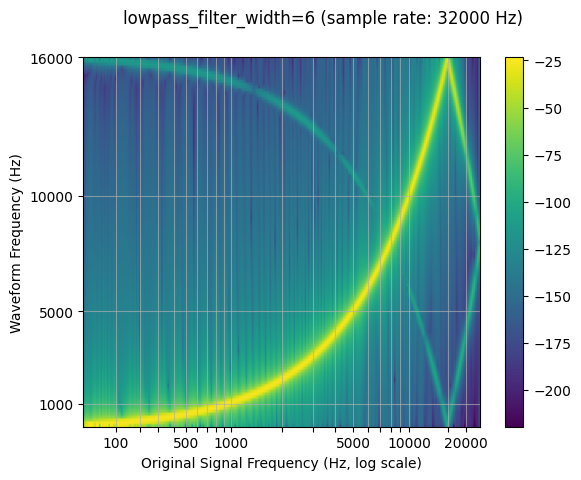

In [70]:
sample_rate = 48000
resample_rate = 32000

resampled_waveform = F.resample(waveform, sample_rate, resample_rate, lowpass_filter_width=6)
plot_sweep(resampled_waveform, resample_rate, title="lowpass_filter_width=6")

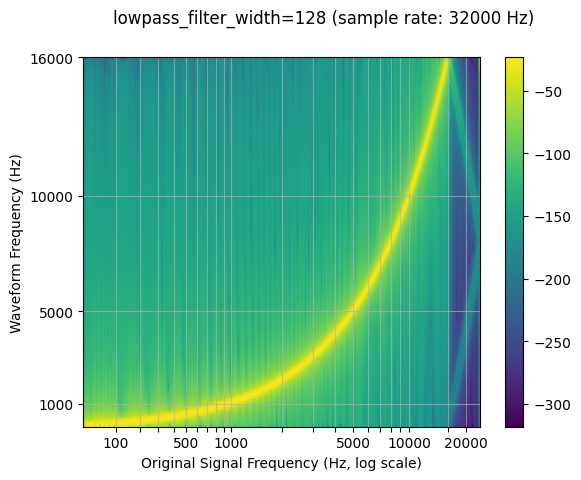

In [71]:
resampled_waveform = F.resample(waveform, sample_rate, resample_rate, lowpass_filter_width=128)
plot_sweep(resampled_waveform, resample_rate, title="lowpass_filter_width=128")

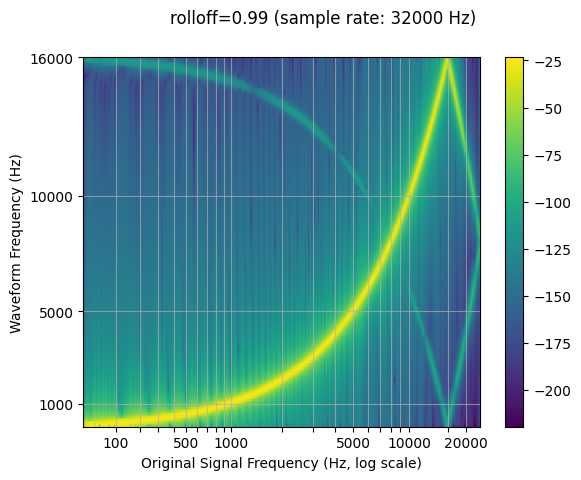

In [72]:
sample_rate = 48000
resample_rate = 32000

resampled_waveform = F.resample(waveform, sample_rate, resample_rate, rolloff=0.99)
plot_sweep(resampled_waveform, resample_rate, title="rolloff=0.99")

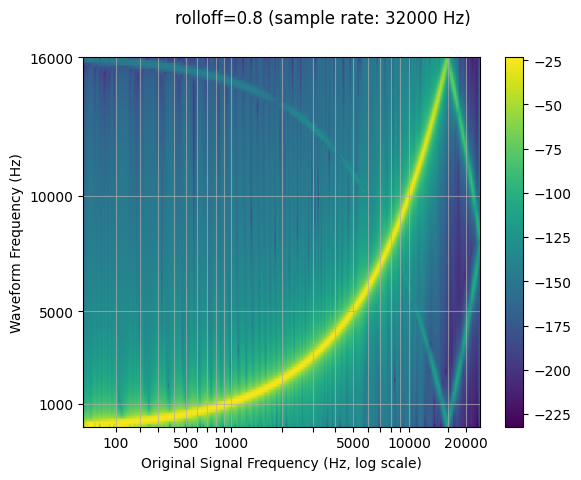

In [73]:
resampled_waveform = F.resample(waveform, sample_rate, resample_rate, rolloff=0.8)
plot_sweep(resampled_waveform, resample_rate, title="rolloff=0.8")

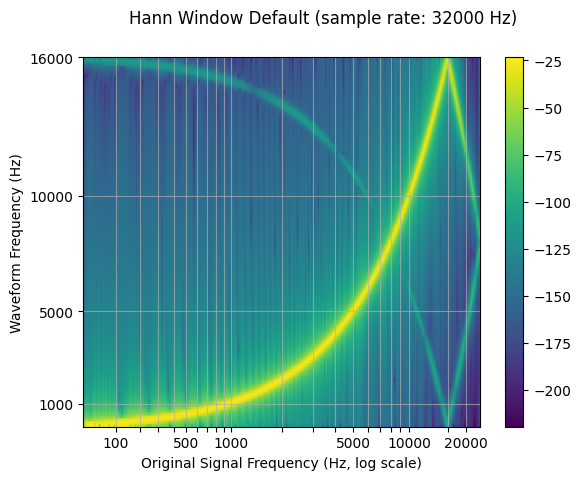

In [74]:
sample_rate = 48000
resample_rate = 32000

resampled_waveform = F.resample(waveform, sample_rate, resample_rate, resampling_method="sinc_interp_hann")
plot_sweep(resampled_waveform, resample_rate, title="Hann Window Default")

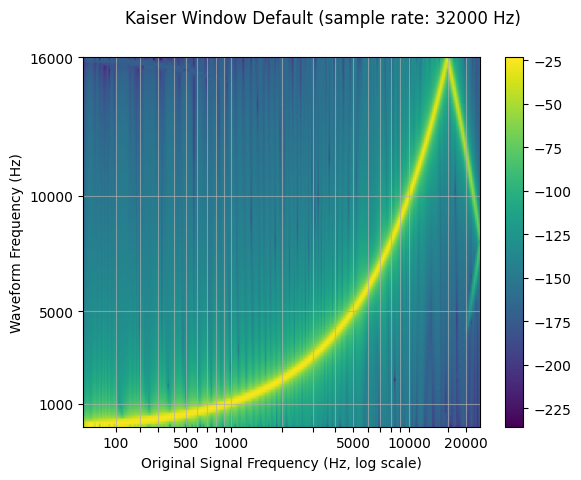

In [75]:
resampled_waveform = F.resample(waveform, sample_rate, resample_rate, resampling_method="sinc_interp_kaiser")
plot_sweep(resampled_waveform, resample_rate, title="Kaiser Window Default")

In [76]:
sample_rate = 48000
resample_rate = 32000

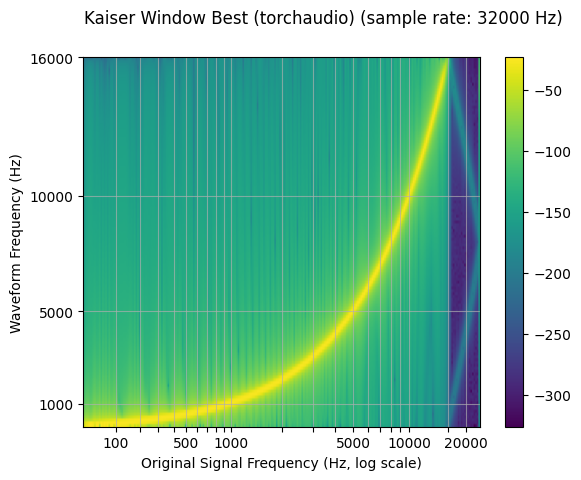

In [77]:
resampled_waveform = F.resample(
    waveform,
    sample_rate,
    resample_rate,
    lowpass_filter_width=64,
    rolloff=0.9475937167399596,
    resampling_method="sinc_interp_kaiser",
    beta=14.769656459379492,
)
plot_sweep(resampled_waveform, resample_rate, title="Kaiser Window Best (torchaudio)")

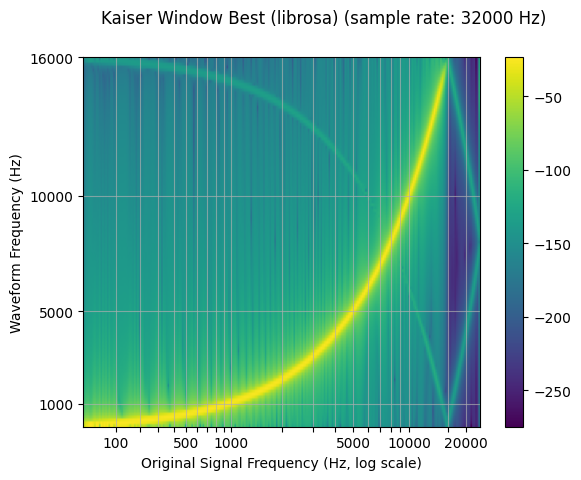

In [78]:
librosa_resampled_waveform = torch.from_numpy(
    librosa.resample(waveform.squeeze().numpy(), orig_sr=sample_rate, target_sr=resample_rate, res_type="kaiser_best")
).unsqueeze(0)
plot_sweep(librosa_resampled_waveform, resample_rate, title="Kaiser Window Best (librosa)")

In [79]:
mse = torch.square(resampled_waveform - librosa_resampled_waveform).mean().item()
print("torchaudio and librosa kaiser best MSE:", mse)

torchaudio and librosa kaiser best MSE: 0.0013004566355607605


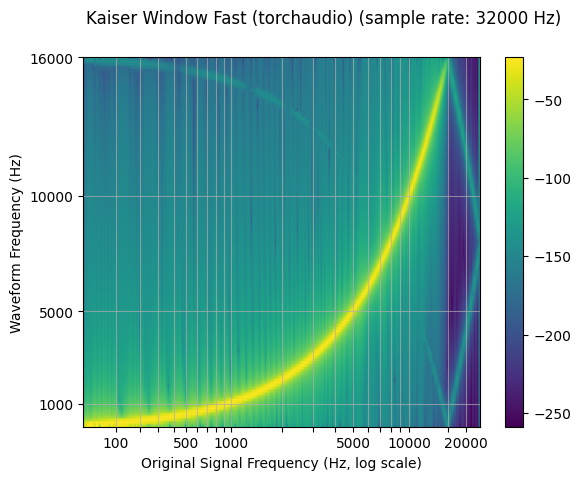

In [80]:
resampled_waveform = F.resample(
    waveform,
    sample_rate,
    resample_rate,
    lowpass_filter_width=16,
    rolloff=0.85,
    resampling_method="sinc_interp_kaiser",
    beta=8.555504641634386,
)
plot_sweep(resampled_waveform, resample_rate, title="Kaiser Window Fast (torchaudio)")

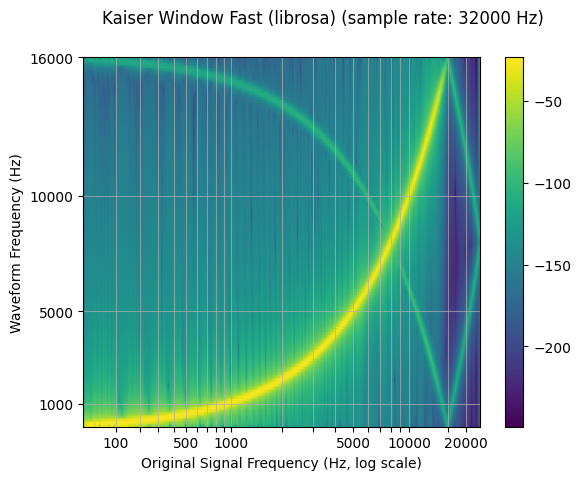

In [81]:
librosa_resampled_waveform = torch.from_numpy(
    librosa.resample(waveform.squeeze().numpy(), orig_sr=sample_rate, target_sr=resample_rate, res_type="kaiser_fast")
).unsqueeze(0)
plot_sweep(librosa_resampled_waveform, resample_rate, title="Kaiser Window Fast (librosa)")

In [82]:
mse = torch.square(resampled_waveform - librosa_resampled_waveform).mean().item()
print("torchaudio and librosa kaiser fast MSE:", mse)

torchaudio and librosa kaiser fast MSE: 0.0002567981251853194


In [83]:
print(f"torchaudio: {torchaudio.__version__}")
print(f"librosa: {librosa.__version__}")
print(f"resampy: {resampy.__version__}")

torchaudio: 2.8.0+cu126
librosa: 0.11.0
resampy: 0.4.3


In [84]:
def benchmark_resample_functional(
    waveform,
    sample_rate,
    resample_rate,
    lowpass_filter_width=6,
    rolloff=0.99,
    resampling_method="sinc_interp_hann",
    beta=None,
    iters=5,
):
    return (
        timeit.timeit(
            stmt="""
torchaudio.functional.resample(
    waveform,
    sample_rate,
    resample_rate,
    lowpass_filter_width=lowpass_filter_width,
    rolloff=rolloff,
    resampling_method=resampling_method,
    beta=beta,
)
        """,
            setup="import torchaudio",
            number=iters,
            globals=locals(),
        )
        * 1000
        / iters
    )

In [85]:
def benchmark_resample_transforms(
    waveform,
    sample_rate,
    resample_rate,
    lowpass_filter_width=6,
    rolloff=0.99,
    resampling_method="sinc_interp_hann",
    beta=None,
    iters=5,
):
    return (
        timeit.timeit(
            stmt="resampler(waveform)",
            setup="""
import torchaudio

resampler = torchaudio.transforms.Resample(
    sample_rate,
    resample_rate,
    lowpass_filter_width=lowpass_filter_width,
    rolloff=rolloff,
    resampling_method=resampling_method,
    dtype=waveform.dtype,
    beta=beta,
)
resampler.to(waveform.device)
        """,
            number=iters,
            globals=locals(),
        )
        * 1000
        / iters
    )

In [86]:
def benchmark_resample_librosa(
    waveform,
    sample_rate,
    resample_rate,
    res_type=None,
    iters=5,
):
    waveform_np = waveform.squeeze().numpy()
    return (
        timeit.timeit(
            stmt="""
librosa.resample(
    waveform_np,
    orig_sr=sample_rate,
    target_sr=resample_rate,
    res_type=res_type,
)
        """,
            setup="import librosa",
            number=iters,
            globals=locals(),
        )
        * 1000
        / iters
    )

In [87]:
def benchmark(sample_rate, resample_rate):
    times, rows = [], []
    waveform = get_sine_sweep(sample_rate).to(torch.float32)

    args = (waveform, sample_rate, resample_rate)

    # sinc 64 zero-crossings
    f_time = benchmark_resample_functional(*args, lowpass_filter_width=64)
    t_time = benchmark_resample_transforms(*args, lowpass_filter_width=64)
    times.append([None, f_time, t_time])
    rows.append("sinc (width 64)")

    # sinc 6 zero-crossings
    f_time = benchmark_resample_functional(*args, lowpass_filter_width=16)
    t_time = benchmark_resample_transforms(*args, lowpass_filter_width=16)
    times.append([None, f_time, t_time])
    rows.append("sinc (width 16)")

    # kaiser best
    kwargs = {
        "lowpass_filter_width": 64,
        "rolloff": 0.9475937167399596,
        "resampling_method": "sinc_interp_kaiser",
        "beta": 14.769656459379492,
    }
    lib_time = benchmark_resample_librosa(*args, res_type="kaiser_best")
    f_time = benchmark_resample_functional(*args, **kwargs)
    t_time = benchmark_resample_transforms(*args, **kwargs)
    times.append([lib_time, f_time, t_time])
    rows.append("kaiser_best")

    # kaiser fast
    kwargs = {
        "lowpass_filter_width": 16,
        "rolloff": 0.85,
        "resampling_method": "sinc_interp_kaiser",
        "beta": 8.555504641634386,
    }
    lib_time = benchmark_resample_librosa(*args, res_type="kaiser_fast")
    f_time = benchmark_resample_functional(*args, **kwargs)
    t_time = benchmark_resample_transforms(*args, **kwargs)
    times.append([lib_time, f_time, t_time])
    rows.append("kaiser_fast")

    df = pd.DataFrame(times, columns=["librosa", "functional", "transforms"], index=rows)
    return df

In [88]:
def plot(df):
    print(df.round(2))
    ax = df.plot(kind="bar")
    plt.ylabel("Time Elapsed [ms]")
    plt.xticks(rotation=0, fontsize=10)
    for cont, col, color in zip(ax.containers, df.columns, mcolors.TABLEAU_COLORS):
        label = ["N/A" if v != v else str(v) for v in df[col].round(2)]
        ax.bar_label(cont, labels=label, color=color, fontweight="bold", fontsize="x-small")

                 librosa  functional  transforms
sinc (width 64)      NaN        1.36        0.69
sinc (width 16)      NaN        1.29        0.60
kaiser_best        24.12        4.24        0.69
kaiser_fast         7.30        2.89        0.57


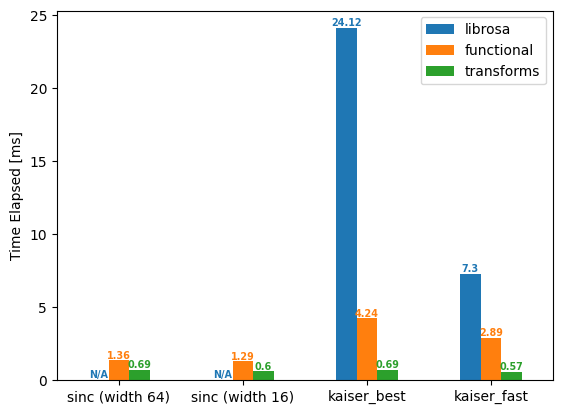

In [89]:
df = benchmark(48_000, 44_100)
plot(df)

                 librosa  functional  transforms
sinc (width 64)      NaN        4.25        3.75
sinc (width 16)      NaN        1.34        1.11
kaiser_best        10.30        4.37        4.01
kaiser_fast         4.42        2.61        1.52


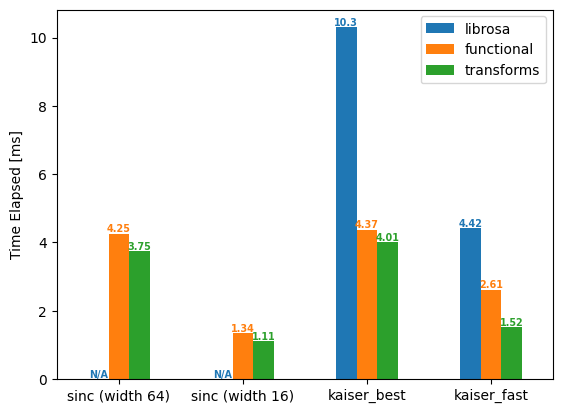

In [90]:
df = benchmark(16_000, 8_000)
plot(df)

                 librosa  functional  transforms
sinc (width 64)      NaN        2.02        1.06
sinc (width 16)      NaN        1.55        1.00
kaiser_best        51.22        5.49        1.06
kaiser_fast        13.44        4.04        0.89


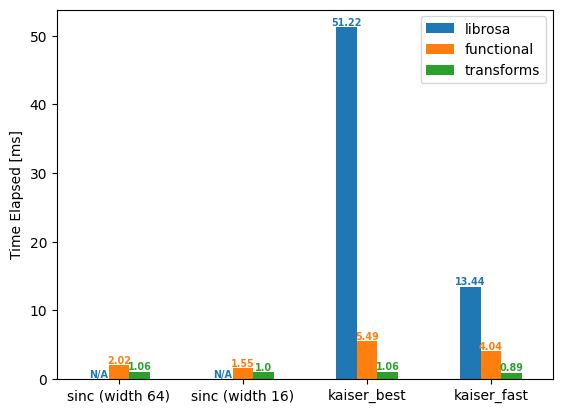

In [91]:
df = benchmark(44_100, 48_000)
plot(df)

                 librosa  functional  transforms
sinc (width 64)      NaN        1.32        0.66
sinc (width 16)      NaN        0.56        0.31
kaiser_best        10.63        1.00        0.66
kaiser_fast         2.82        0.68        0.40


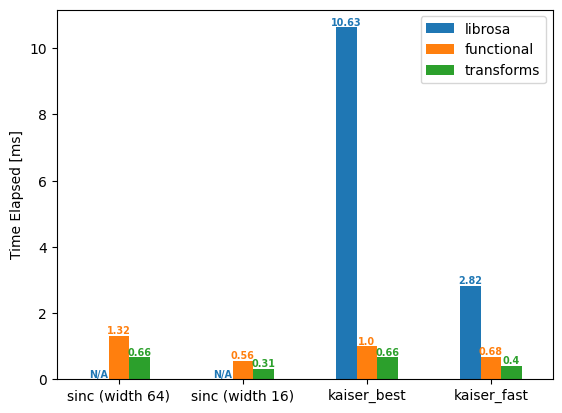

In [92]:
df = benchmark(8_000, 16_000)
plot(df)

In [93]:
import torch
import torchaudio
import torchaudio.functional as F
import torchaudio.transforms as T

print(torch.__version__)
print(torchaudio.__version__)

import librosa
import matplotlib.pyplot as plt

2.8.0+cu126
2.8.0+cu126


In [94]:
 !pip install librosa</p></div>

/bin/bash: -c: line 1: syntax error near unexpected token `<'
/bin/bash: -c: line 1: `pip install librosa</p></div>'


In [95]:
from IPython.display import Audio
from matplotlib.patches import Rectangle
from torchaudio.utils import download_asset

torch.random.manual_seed(0)

SAMPLE_SPEECH = download_asset("tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav")


def plot_waveform(waveform, sr, title="Waveform", ax=None):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sr

    if ax is None:
        _, ax = plt.subplots(num_channels, 1)
    ax.plot(time_axis, waveform[0], linewidth=1)
    ax.grid(True)
    ax.set_xlim([0, time_axis[-1]])
    ax.set_title(title)


def plot_spectrogram(specgram, title=None, ylabel="freq_bin", ax=None):
    if ax is None:
        _, ax = plt.subplots(1, 1)
    if title is not None:
        ax.set_title(title)
    ax.set_ylabel(ylabel)
    ax.imshow(librosa.power_to_db(specgram), origin="lower", aspect="auto", interpolation="nearest")


def plot_fbank(fbank, title=None):
    fig, axs = plt.subplots(1, 1)
    axs.set_title(title or "Filter bank")
    axs.imshow(fbank, aspect="auto")
    axs.set_ylabel("frequency bin")
    axs.set_xlabel("mel bin")

/tmp/ipython-input-2923409085.py:7: UserWarning: torchaudio.utils.download.download_asset has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. Please see https://github.com/pytorch/audio/issues/3902 for more information. It will be removed from the 2.9 release. 
  SAMPLE_SPEECH = download_asset("tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav")


In [96]:
# Load audio
SPEECH_WAVEFORM, SAMPLE_RATE = torchaudio.load(SAMPLE_SPEECH)

# Define transform
spectrogram = T.Spectrogram(n_fft=512)

# Perform transform
spec = spectrogram(SPEECH_WAVEFORM)

/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/audio/issues/3902 for more information. It will be r

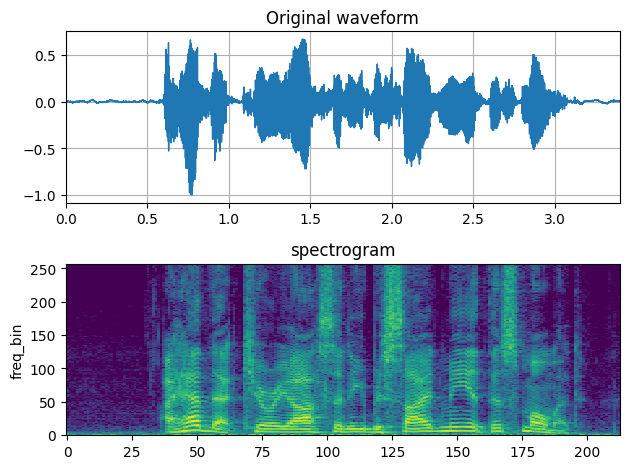

In [97]:
fig, axs = plt.subplots(2, 1)
plot_waveform(SPEECH_WAVEFORM, SAMPLE_RATE, title="Original waveform", ax=axs[0])
plot_spectrogram(spec[0], title="spectrogram", ax=axs[1])
fig.tight_layout()

In [98]:
Audio(SPEECH_WAVEFORM.numpy(), rate=SAMPLE_RATE)

In [99]:
n_ffts = [32, 128, 512, 2048]
hop_length = 64

specs = []
for n_fft in n_ffts:
    spectrogram = T.Spectrogram(n_fft=n_fft, hop_length=hop_length)
    spec = spectrogram(SPEECH_WAVEFORM)
    specs.append(spec)

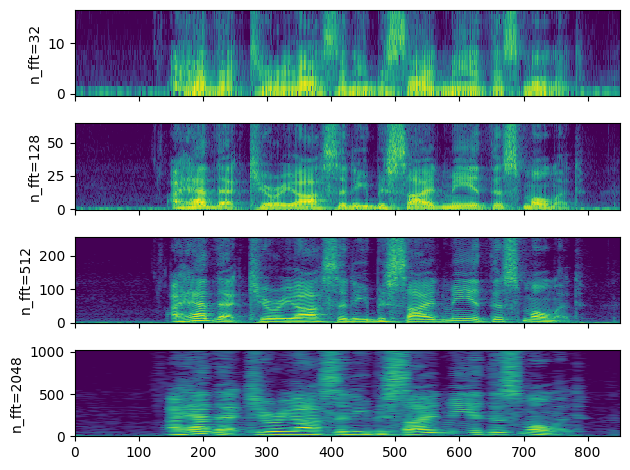

In [100]:
fig, axs = plt.subplots(len(specs), 1, sharex=True)
for i, (spec, n_fft) in enumerate(zip(specs, n_ffts)):
    plot_spectrogram(spec[0], ylabel=f"n_fft={n_fft}", ax=axs[i])
    axs[i].set_xlabel(None)
fig.tight_layout()

In [101]:
# Downsample to half of the original sample rate
speech2 = torchaudio.functional.resample(SPEECH_WAVEFORM, SAMPLE_RATE, SAMPLE_RATE // 2)
# Upsample to the original sample rate
speech3 = torchaudio.functional.resample(speech2, SAMPLE_RATE // 2, SAMPLE_RATE)

In [102]:
# Apply the same spectrogram
spectrogram = T.Spectrogram(n_fft=512)

spec0 = spectrogram(SPEECH_WAVEFORM)
spec2 = spectrogram(speech2)
spec3 = spectrogram(speech3)

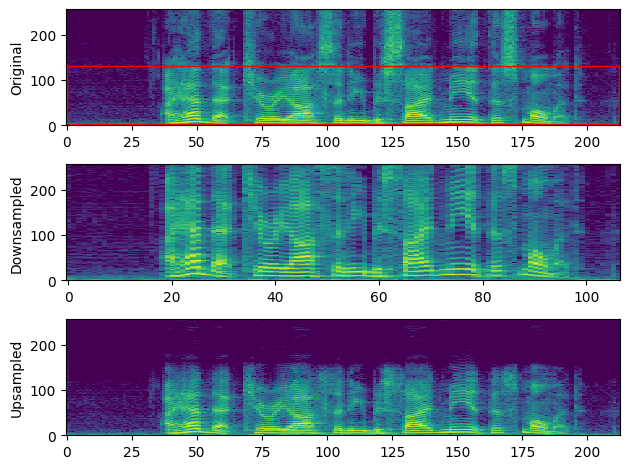

In [103]:
# Visualize it
fig, axs = plt.subplots(3, 1)
plot_spectrogram(spec0[0], ylabel="Original", ax=axs[0])
axs[0].add_patch(Rectangle((0, 3), 212, 128, edgecolor="r", facecolor="none"))
plot_spectrogram(spec2[0], ylabel="Downsampled", ax=axs[1])
plot_spectrogram(spec3[0], ylabel="Upsampled", ax=axs[2])
fig.tight_layout()

In [104]:
# Define transforms
n_fft = 1024
spectrogram = T.Spectrogram(n_fft=n_fft)
griffin_lim = T.GriffinLim(n_fft=n_fft)

# Apply the transforms
spec = spectrogram(SPEECH_WAVEFORM)
reconstructed_waveform = griffin_lim(spec)

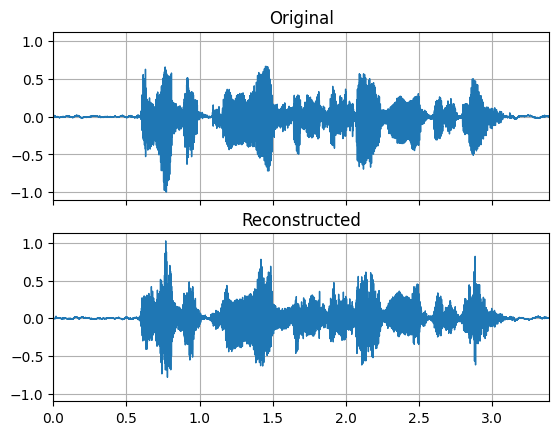

In [105]:
_, axes = plt.subplots(2, 1, sharex=True, sharey=True)
plot_waveform(SPEECH_WAVEFORM, SAMPLE_RATE, title="Original", ax=axes[0])
plot_waveform(reconstructed_waveform, SAMPLE_RATE, title="Reconstructed", ax=axes[1])
Audio(reconstructed_waveform, rate=SAMPLE_RATE)

In [106]:
n_fft = 256
n_mels = 64
sample_rate = 6000

mel_filters = F.melscale_fbanks(
    int(n_fft // 2 + 1),
    n_mels=n_mels,
    f_min=0.0,
    f_max=sample_rate / 2.0,
    sample_rate=sample_rate,
    norm="slaney",
)

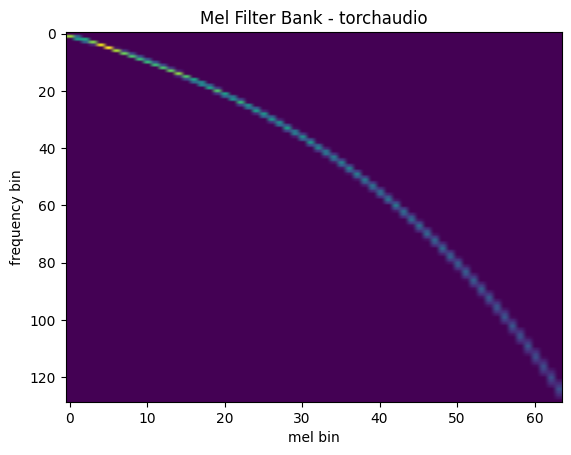

In [107]:
plot_fbank(mel_filters, "Mel Filter Bank - torchaudio")

In [108]:
mel_filters_librosa = librosa.filters.mel(
    sr=sample_rate,
    n_fft=n_fft,
    n_mels=n_mels,
    fmin=0.0,
    fmax=sample_rate / 2.0,
    norm="slaney",
    htk=True,
).T

/tmp/ipython-input-607204609.py:3: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  mse = torch.square(mel_filters - mel_filters_librosa).mean().item()


Mean Square Difference:  3.934872696751886e-17


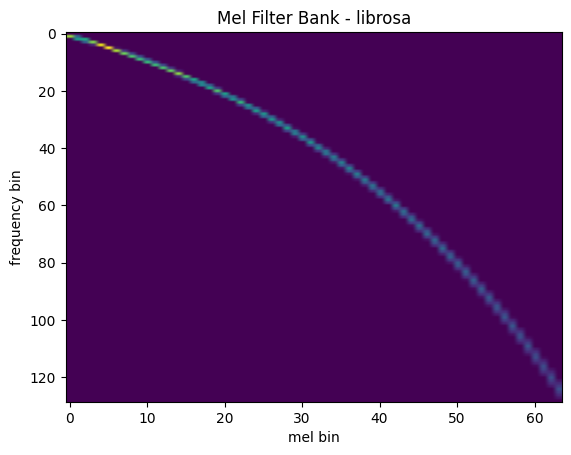

In [109]:
plot_fbank(mel_filters_librosa, "Mel Filter Bank - librosa")

mse = torch.square(mel_filters - mel_filters_librosa).mean().item()
print("Mean Square Difference: ", mse)

In [110]:
n_fft = 1024
win_length = None
hop_length = 512
n_mels = 128

mel_spectrogram = T.MelSpectrogram(
    sample_rate=sample_rate,
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    center=True,
    pad_mode="reflect",
    power=2.0,
    norm="slaney",
    n_mels=n_mels,
    mel_scale="htk",
)

melspec = mel_spectrogram(SPEECH_WAVEFORM)

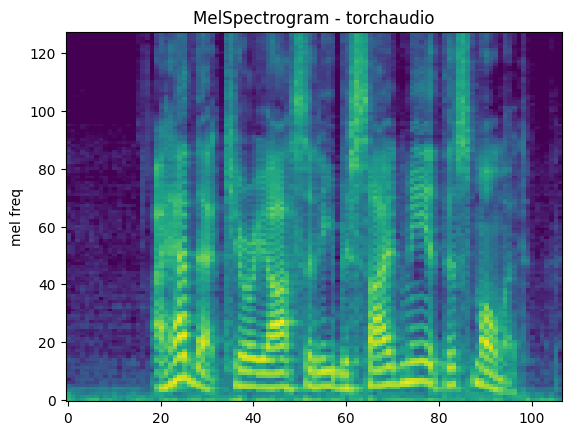

In [111]:
plot_spectrogram(melspec[0], title="MelSpectrogram - torchaudio", ylabel="mel freq")

In [112]:
melspec_librosa = librosa.feature.melspectrogram(
    y=SPEECH_WAVEFORM.numpy()[0],
    sr=sample_rate,
    n_fft=n_fft,
    hop_length=hop_length,
    win_length=win_length,
    center=True,
    pad_mode="reflect",
    power=2.0,
    n_mels=n_mels,
    norm="slaney",
    htk=True,
)

/tmp/ipython-input-2206006589.py:3: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  mse = torch.square(melspec - melspec_librosa).mean().item()


Mean Square Difference:  1.2880109201418577e-09


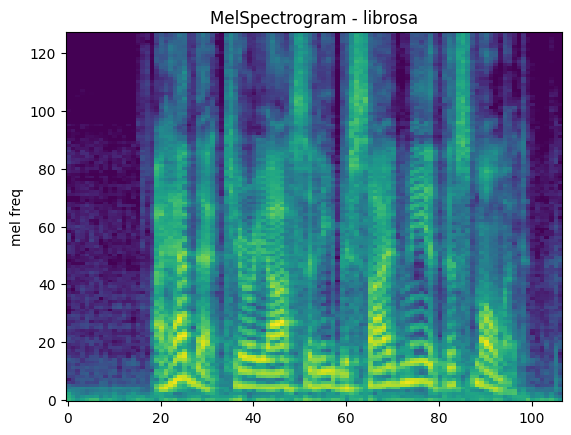

In [113]:
plot_spectrogram(melspec_librosa, title="MelSpectrogram - librosa", ylabel="mel freq")

mse = torch.square(melspec - melspec_librosa).mean().item()
print("Mean Square Difference: ", mse)

In [114]:
n_fft = 2048
win_length = None
hop_length = 512
n_mels = 256
n_mfcc = 256

mfcc_transform = T.MFCC(
    sample_rate=sample_rate,
    n_mfcc=n_mfcc,
    melkwargs={
        "n_fft": n_fft,
        "n_mels": n_mels,
        "hop_length": hop_length,
        "mel_scale": "htk",
    },
)

mfcc = mfcc_transform(SPEECH_WAVEFORM)

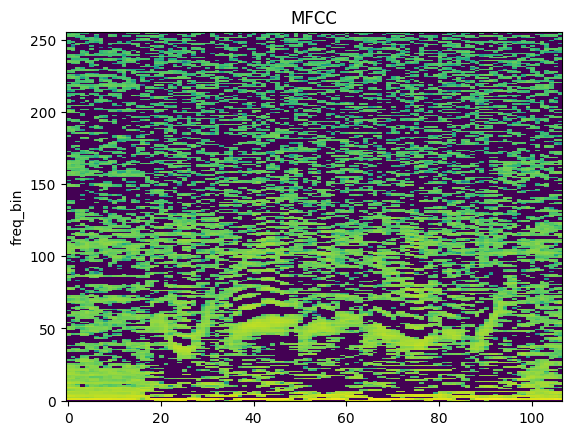

In [115]:
plot_spectrogram(mfcc[0], title="MFCC")

In [116]:
melspec = librosa.feature.melspectrogram(
    y=SPEECH_WAVEFORM.numpy()[0],
    sr=sample_rate,
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    n_mels=n_mels,
    htk=True,
    norm=None,
)

mfcc_librosa = librosa.feature.mfcc(
    S=librosa.core.spectrum.power_to_db(melspec),
    n_mfcc=n_mfcc,
    dct_type=2,
    norm="ortho",
)

/tmp/ipython-input-1658487374.py:3: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  mse = torch.square(mfcc - mfcc_librosa).mean().item()


Mean Square Difference:  0.8103960752487183


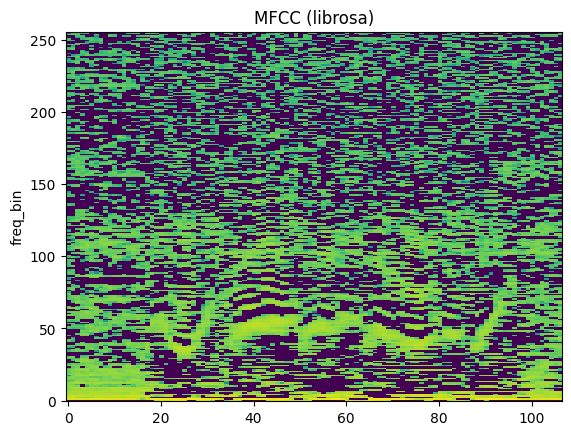

In [117]:
plot_spectrogram(mfcc_librosa, title="MFCC (librosa)")

mse = torch.square(mfcc - mfcc_librosa).mean().item()
print("Mean Square Difference: ", mse)

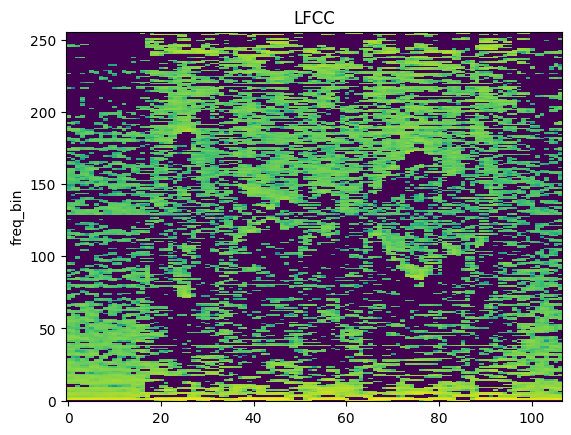

In [118]:
n_fft = 2048
win_length = None
hop_length = 512
n_lfcc = 256

lfcc_transform = T.LFCC(
    sample_rate=sample_rate,
    n_lfcc=n_lfcc,
    speckwargs={
        "n_fft": n_fft,
        "win_length": win_length,
        "hop_length": hop_length,
    },
)

lfcc = lfcc_transform(SPEECH_WAVEFORM)
plot_spectrogram(lfcc[0], title="LFCC")

In [119]:
pitch = F.detect_pitch_frequency(SPEECH_WAVEFORM, SAMPLE_RATE)

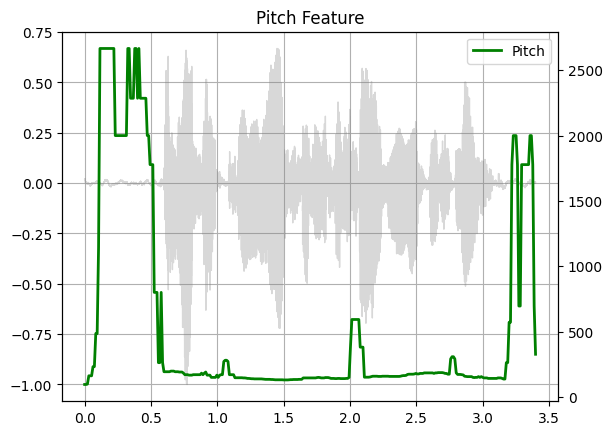

In [120]:
def plot_pitch(waveform, sr, pitch):
    figure, axis = plt.subplots(1, 1)
    axis.set_title("Pitch Feature")
    axis.grid(True)

    end_time = waveform.shape[1] / sr
    time_axis = torch.linspace(0, end_time, waveform.shape[1])
    axis.plot(time_axis, waveform[0], linewidth=1, color="gray", alpha=0.3)

    axis2 = axis.twinx()
    time_axis = torch.linspace(0, end_time, pitch.shape[1])
    axis2.plot(time_axis, pitch[0], linewidth=2, label="Pitch", color="green")

    axis2.legend(loc=0)


plot_pitch(SPEECH_WAVEFORM, SAMPLE_RATE, pitch)

# Task
Perform downsampling, upsampling, and feature extraction (Spectrogram, MelSpectrogram, MFCC, LFCC, and Pitch) on the audio files located in the "/content" directory. Visualize the waveforms and extracted features for the original, downsampled, and upsampled audio.

## Load audio files

### Subtask:
Iterate through the identified audio files in the `/content` directory and load each one using torchaudio.

**Reasoning**:
Get the list of audio files and load them one by one for processing.

In [126]:
# Get the list of audio file names from the content directory
audio_files = [f for f in os.listdir('/content') if f.endswith(('.wav', '.mp3', '.m4a'))]

# Process each audio file
audio_data = {}
for file_name in audio_files:
    print(f"Processing file: {file_name}")
    try:
        # Load the audio file
        waveform, sample_rate = torchaudio.load(os.path.join('/content', file_name))
        audio_data[file_name] = {"waveform": waveform, "sample_rate": sample_rate}
    except Exception as e:
        print(f"Error processing {file_name}: {e}")

Processing file: 095522039.m4a
Processing file: 095522041.m4a
Processing file: 095522042.m4a
Processing file: 095522040.m4a


/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/audio/issues/3902 for more information. It will be r

## Downsample and upsample

### Subtask:
For each loaded audio file, perform downsampling and then upsampling using `torchaudio.functional.resample`.

**Reasoning**:
Iterate through the audio_data dictionary, perform downsampling and upsampling for each audio file, and store the results back in the dictionary.

In [129]:
import torchaudio.functional as F

for file_name, data in audio_data.items():
    waveform = data["waveform"]
    sample_rate = data["sample_rate"]

    # Define resample rate (half of original)
    resample_rate = sample_rate // 2

    # Downsample the waveform
    downsampled_waveform = F.resample(waveform, sample_rate, resample_rate)

    # Upsample the downsampled waveform
    upsampled_waveform = F.resample(downsampled_waveform, resample_rate, sample_rate)

    # Store the downsampled and upsampled waveforms
    audio_data[file_name]["downsampled_waveform"] = downsampled_waveform
    audio_data[file_name]["upsampled_waveform"] = upsampled_waveform

print("Downsampling and upsampling complete.")

Downsampling and upsampling complete.


**Reasoning**:
Iterate through the audio data and extract features for each waveform.

## Feature extraction

### Subtask:
For each loaded audio file, perform feature extraction (Spectrogram, MelSpectrogram, MFCC, LFCC, and Pitch) using the appropriate torchaudio transforms and functions.

**Reasoning**:
Iterate through the audio data and extract features for each waveform.

In [130]:
import torchaudio.transforms as T

n_fft = 1024
hop_length = 512
n_mels = 128
n_mfcc = 128  # Adjusted n_mfcc to be <= n_mels
n_lfcc = 256

for file_name, data in audio_data.items():
    original_waveform = data["waveform"]
    sample_rate = data["sample_rate"]
    downsampled_waveform = data["downsampled_waveform"]
    upsampled_waveform = data["upsampled_waveform"]

    # Feature extraction for original waveform
    spectrogram_transform = T.Spectrogram(n_fft=n_fft, hop_length=hop_length)
    melspectrogram_transform = T.MelSpectrogram(sample_rate=sample_rate, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
    mfcc_transform = T.MFCC(sample_rate=sample_rate, n_mfcc=n_mfcc, melkwargs={"n_fft": n_fft, "n_mels": n_mels, "hop_length": hop_length})
    lfcc_transform = T.LFCC(sample_rate=sample_rate, n_lfcc=n_lfcc, speckwargs={"n_fft": n_fft, "hop_length": hop_length})

    data["original"] = {
        "spectrogram": spectrogram_transform(original_waveform),
        "melspectrogram": melspectrogram_transform(original_waveform),
        "mfcc": mfcc_transform(original_waveform),
        "lfcc": lfcc_transform(original_waveform),
        "pitch": F.detect_pitch_frequency(original_waveform, sample_rate),
    }

    # Feature extraction for downsampled waveform
    downsampled_sample_rate = sample_rate // 2
    melspectrogram_transform_downsampled = T.MelSpectrogram(sample_rate=downsampled_sample_rate, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
    mfcc_transform_downsampled = T.MFCC(sample_rate=downsampled_sample_rate, n_mfcc=n_mfcc, melkwargs={"n_fft": n_fft, "n_mels": n_mels, "hop_length": hop_length})
    lfcc_transform_downsampled = T.LFCC(sample_rate=downsampled_sample_rate, n_lfcc=n_lfcc, speckwargs={"n_fft": n_fft, "hop_length": hop_length})

    data["downsampled"] = {
        "spectrogram": spectrogram_transform(downsampled_waveform),
        "melspectrogram": melspectrogram_transform_downsampled(downsampled_waveform),
        "mfcc": mfcc_transform_downsampled(downsampled_waveform),
        "lfcc": lfcc_transform_downsampled(downsampled_waveform),
        "pitch": F.detect_pitch_frequency(downsampled_waveform, downsampled_sample_rate),
    }

    # Feature extraction for upsampled waveform
    upsampled_sample_rate = sample_rate
    melspectrogram_transform_upsampled = T.MelSpectrogram(sample_rate=upsampled_sample_rate, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
    mfcc_transform_upsampled = T.MFCC(sample_rate=upsampled_sample_rate, n_mfcc=n_mfcc, melkwargs={"n_fft": n_fft, "n_mels": n_mels, "hop_length": hop_length})
    lfcc_transform_upsampled = T.LFCC(sample_rate=upsampled_sample_rate, n_lfcc=n_lfcc, speckwargs={"n_fft": n_fft, "hop_length": hop_length})

    data["upsampled"] = {
        "spectrogram": spectrogram_transform(upsampled_waveform),
        "melspectrogram": melspectrogram_transform_upsampled(upsampled_waveform),
        "mfcc": mfcc_transform_upsampled(upsampled_waveform),
        "lfcc": lfcc_transform_upsampled(upsampled_waveform),
        "pitch": F.detect_pitch_frequency(upsampled_waveform, upsampled_sample_rate),
    }

print("Feature extraction complete.")

/usr/local/lib/python3.12/dist-packages/torchaudio/functional/functional.py:585: UserWarning: At least one mel filterbank has all zero values. The value for `n_mels` (128) may be set too high. Or, the value for `n_freqs` (513) may be set too low.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchaudio/functional/functional.py:585: UserWarning: At least one mel filterbank has all zero values. The value for `n_mels` (128) may be set too high. Or, the value for `n_freqs` (513) may be set too low.
  warnings.warn(


Feature extraction complete.


## Visualize results

### Subtask:
Display the waveforms and relevant feature plots for the original, downsampled, and upsampled audio, as well as the extracted features for each file.

**Reasoning**:
Iterate through the audio data and plot the waveforms and extracted features for each file as requested in the instructions.

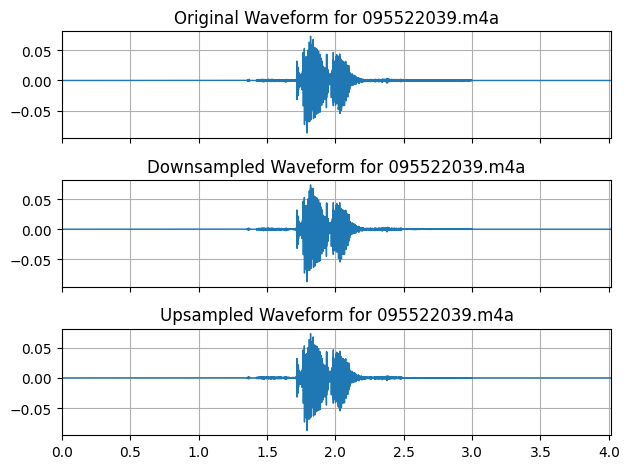

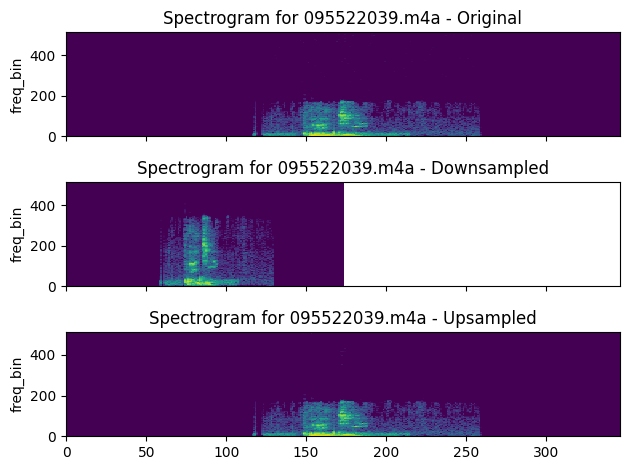

<Figure size 640x480 with 0 Axes>

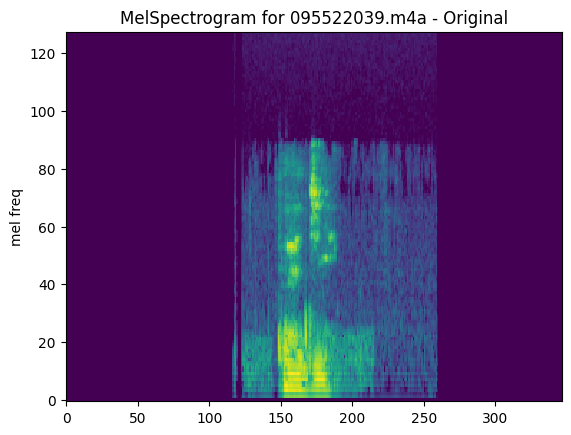

<Figure size 640x480 with 0 Axes>

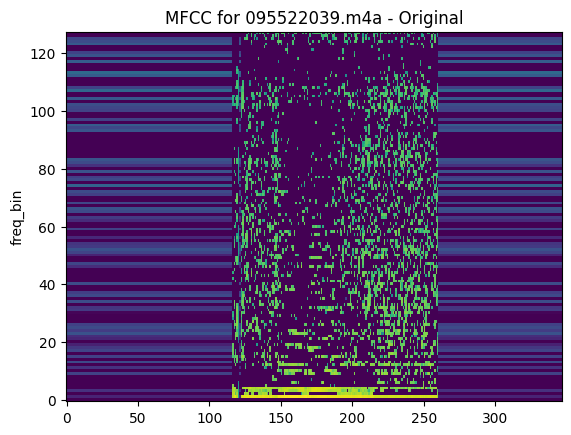

<Figure size 640x480 with 0 Axes>

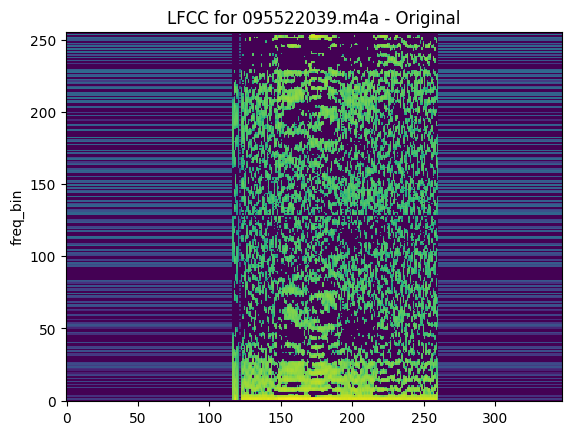

<Figure size 640x480 with 0 Axes>

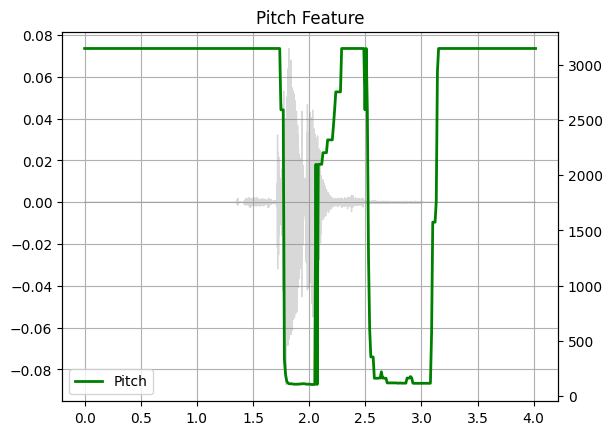

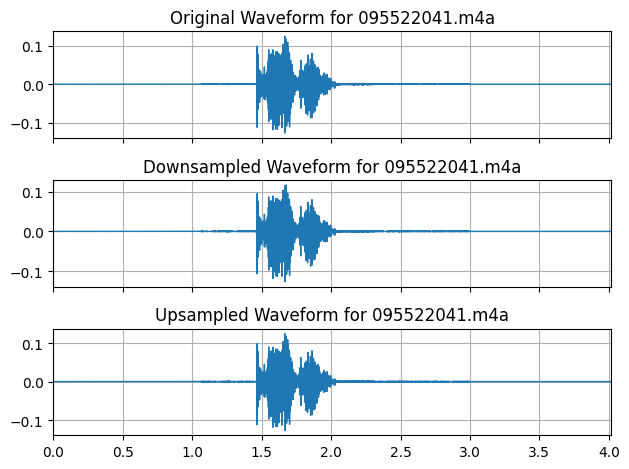

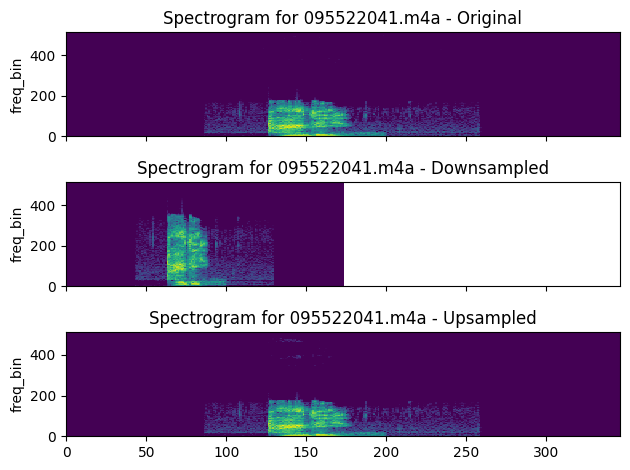

<Figure size 640x480 with 0 Axes>

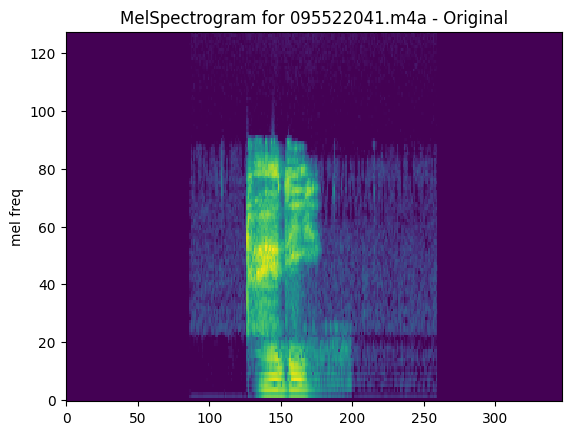

<Figure size 640x480 with 0 Axes>

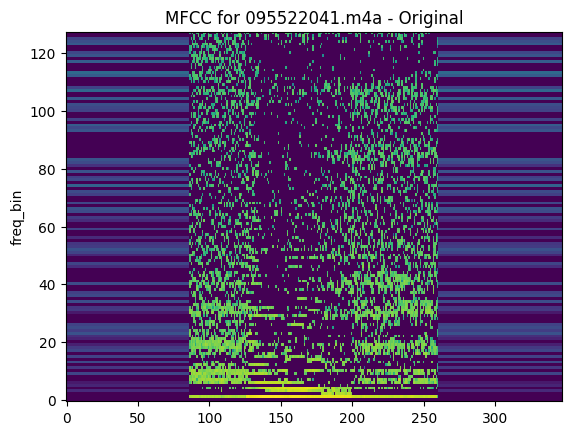

<Figure size 640x480 with 0 Axes>

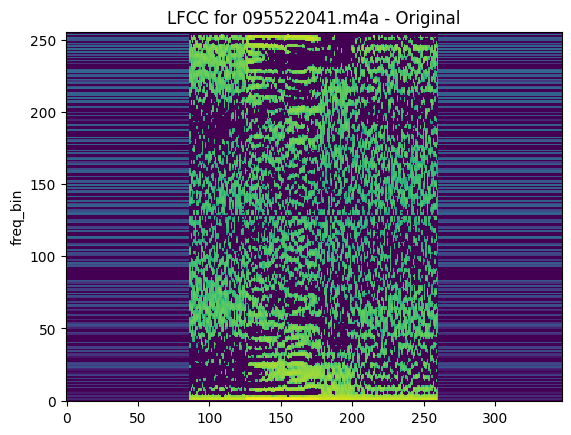

<Figure size 640x480 with 0 Axes>

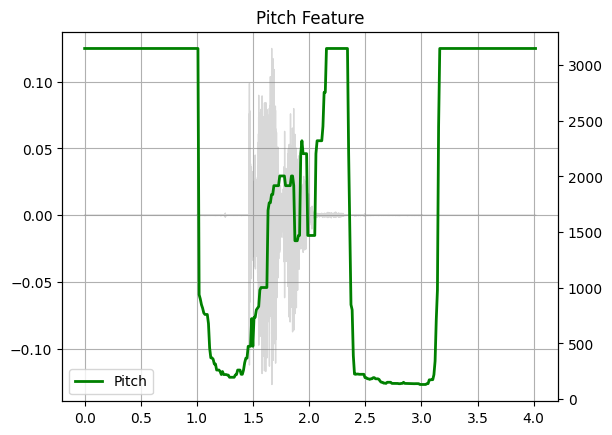

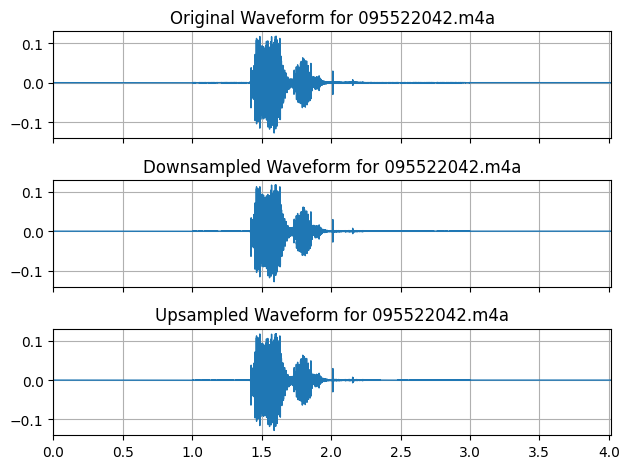

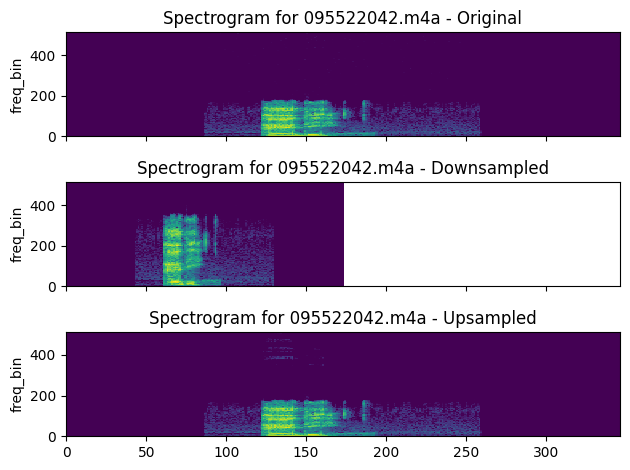

<Figure size 640x480 with 0 Axes>

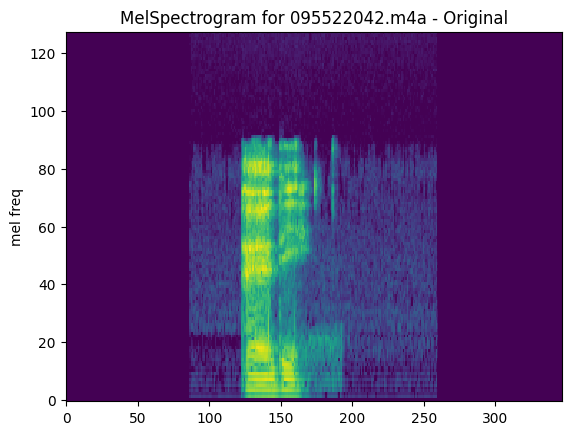

<Figure size 640x480 with 0 Axes>

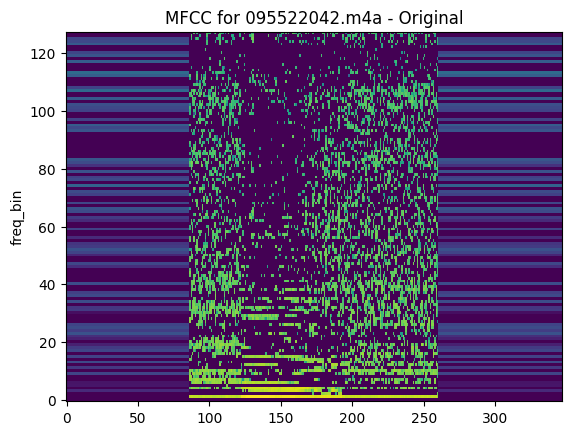

<Figure size 640x480 with 0 Axes>

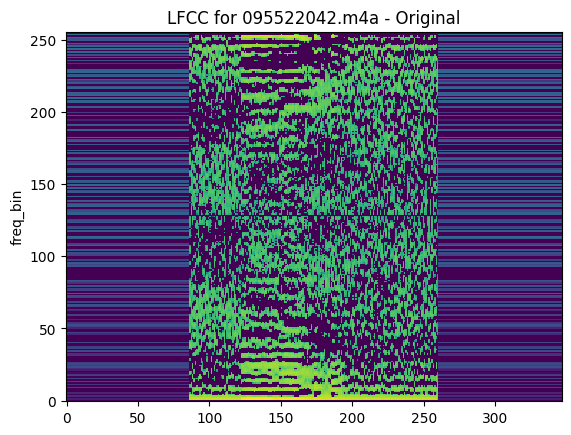

<Figure size 640x480 with 0 Axes>

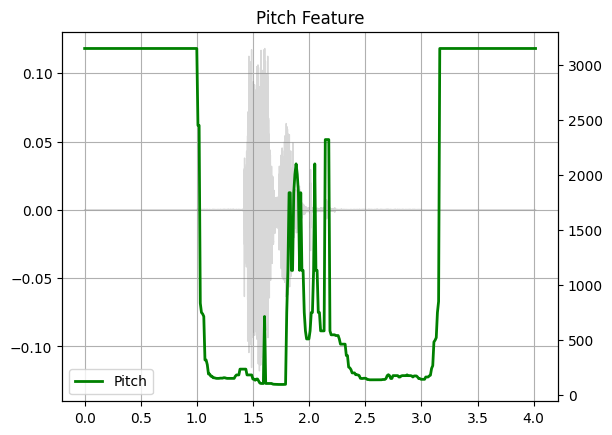

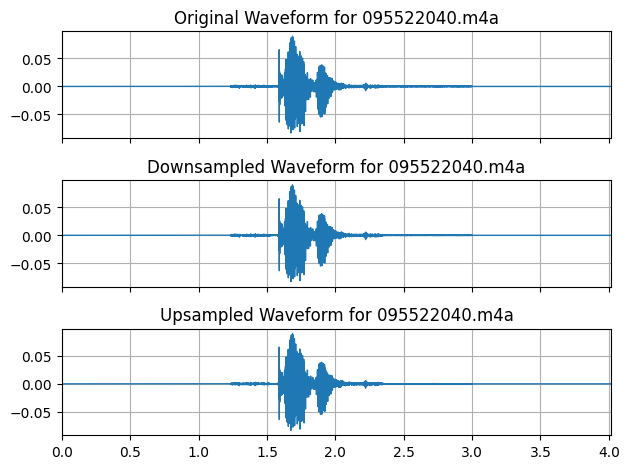

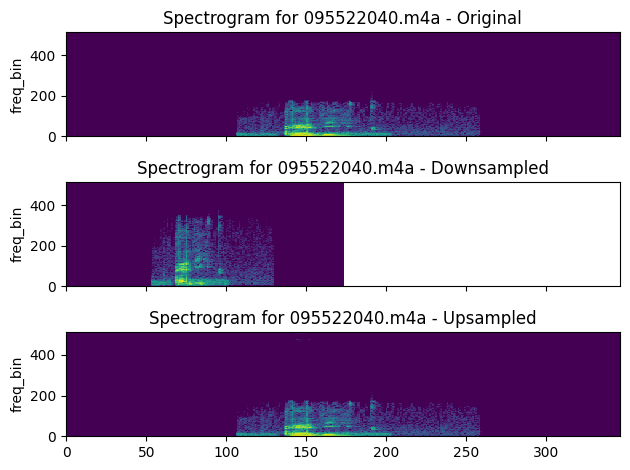

<Figure size 640x480 with 0 Axes>

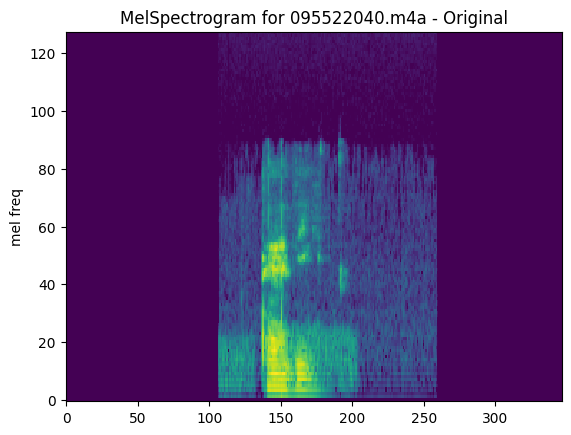

<Figure size 640x480 with 0 Axes>

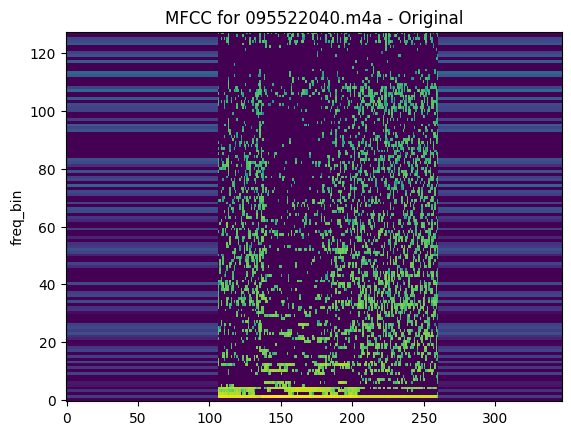

<Figure size 640x480 with 0 Axes>

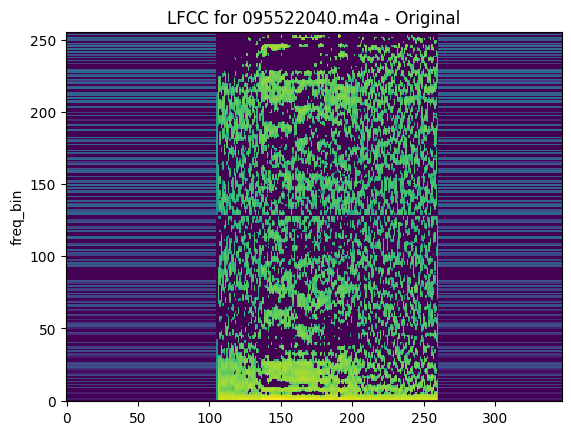

<Figure size 640x480 with 0 Axes>

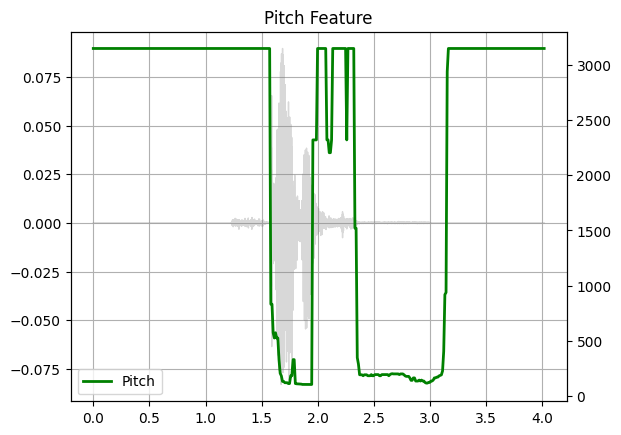

In [131]:
for file_name, data in audio_data.items():
    original_waveform = data["waveform"]
    sample_rate = data["sample_rate"]
    downsampled_waveform = data["downsampled_waveform"]
    upsampled_waveform = data["upsampled_waveform"]

    # Plot waveforms
    fig, axs = plt.subplots(3, 1, sharex=True)
    plot_waveform(original_waveform, sample_rate, title=f"Original Waveform for {file_name}", ax=axs[0])
    plot_waveform(downsampled_waveform, sample_rate // 2, title=f"Downsampled Waveform for {file_name}", ax=axs[1])
    plot_waveform(upsampled_waveform, sample_rate, title=f"Upsampled Waveform for {file_name}", ax=axs[2])
    fig.tight_layout()
    plt.show()

    # Plot spectrograms
    fig, axs = plt.subplots(3, 1, sharex=True)
    plot_spectrogram(data["original"]["spectrogram"][0], title=f"Spectrogram for {file_name} - Original", ax=axs[0])
    plot_spectrogram(data["downsampled"]["spectrogram"][0], title=f"Spectrogram for {file_name} - Downsampled", ax=axs[1])
    plot_spectrogram(data["upsampled"]["spectrogram"][0], title=f"Spectrogram for {file_name} - Upsampled", ax=axs[2])
    fig.tight_layout()
    plt.show()

    # Plot MelSpectrogram for original
    plt.figure()
    plot_spectrogram(data["original"]["melspectrogram"][0], title=f"MelSpectrogram for {file_name} - Original", ylabel="mel freq")
    plt.show()

    # Plot MFCC for original
    plt.figure()
    plot_spectrogram(data["original"]["mfcc"][0], title=f"MFCC for {file_name} - Original")
    plt.show()

    # Plot LFCC for original
    plt.figure()
    plot_spectrogram(data["original"]["lfcc"][0], title=f"LFCC for {file_name} - Original")
    plt.show()

    # Plot Pitch for original
    plt.figure()
    plot_pitch(original_waveform, sample_rate, data["original"]["pitch"])
    plt.show()

    # Display original audio
    display(Audio(original_waveform.numpy()[0], rate=sample_rate))